# Mapping TissueTag annotations to traget object

### This notebook illustrates how to migrate TissueTag annotations to visium spot space in the form of an AnnData object but can also be used to match annotations to any type of spatial data in the form of a pandas DF

1) We will load the TissueTag annotated image of the visium dataset and translate the pixel level annotations to an hexagonal binned grid.
2) we will measure the minimal euclidean distances to the annotations and calculate 2 types of biological axes(OrganAxis). 
3) Finally we will migrate annotations to visium space and print some plots.

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
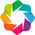

In [3]:
import os
import numpy as np
import pandas as pd
from matplotlib.pyplot import figure
import tissue_tag as tt 
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore', category=DeprecationWarning)

# Part 1 - Load annotation names and colors 

In [8]:
# set path
path_to_tissue_tag = ".."
path = path_to_tissue_tag + '/data/tissue_tag_minimal_example_visium/' 

In [11]:
# load tissue annotations from TissueTag and migrate annotation to a 15um hexagonal grid and outputs the coordinates in ppm=1 

df_anno = tt.anno_to_grid(
    folder=path+'/tissue_annotations/',
    file_name = 'annotations',
    spot_to_spot = 15, # this determines the grid density in microns
    #load_colors=True,
)
df_anno['annotations'].value_counts()

loaded annotation image - annotations size - (3957, 3886)
loaded annotation map
{1: 'unassigned', 2: 'Artifacts', 3: 'Medulla', 4: 'Cortex', 5: 'Edge', 6: 'HS', 7: 'Vessels', 8: 'PVS', 9: 'Other'}
loaded ppm
{'ppm': 0.5}
Generating grid with spacing - 15, from annotation resolution of - 0.5 ppm


annotations
1    174617
4     85577
3     26544
5     16058
2      5200
9      2653
8      1360
6       921
7        40
Name: count, dtype: int64

# Part 2 - Calculate distances to structures and 2 versions of the axis

Here we calculate the relative distances of each spot in the grid to the closest corresponding K spots for each of the annotation categories. 

*note that here I selected K=10 to match the way we calculate the Cortico-Medullary axis for the thymus. However, since we have both broad (cortex,medulla) and fine grained (HS and PVS) structures in the same annotation. This might not be ideal for the fine grained structures. 

Ideally, you might prefer to have multiple annotation "layers" where you have broad and fine annotations separately as we have done in the paper and then select different K for each.   

In [4]:
print('calculating distances')
tt.dist2cluster_fast(
    df=df_anno,
    annotation='annotations',
    KNN=10
    ) # calculate minimum mean distance of each spot to clusters

calculating distances
calculating distance matrix with cKDTree
Artifacts
Cortex
Edge
HS
Medulla
Other
PVS
Vessels
unassigned


{'Artifacts': array([2207.27254737, 2200.7902178 , 2194.39127439, ..., 1560.00976525,
        1572.62223702, 1585.27627036]),
 'Cortex': array([2138.49414387, 2128.73443023, 2118.9404129 , ..., 1696.99389909,
        1709.18827031, 1721.40092017]),
 'Edge': array([2076.90977893, 2067.245057  , 2057.49675507, ..., 1879.09446074,
        1893.37888086, 1907.67428519]),
 'HS': array([2640.94888411, 2632.46702531, 2624.04349871, ..., 1978.00266372,
        1991.25264319, 2004.52704693]),
 'Medulla': array([2542.47121645, 2532.61137472, 2522.80218294, ..., 1700.55670701,
        1713.06536902, 1725.61374033]),
 'Other': array([3702.42352413, 3689.1028739 , 3675.79516326, ..., 2517.27532117,
        2529.72209039, 2542.19642781]),
 'PVS': array([2497.03886421, 2487.42811221, 2477.87088735, ..., 2308.29761987,
        2317.17462036, 2326.11447548]),
 'Vessels': array([6777.72643298, 6765.8431979 , 6753.97236875, ..., 4280.73493236,
        4289.22037978, 4297.74142618]),
 'unassigned': array(

### Calculate morphological axes 

In [5]:
# axis calculations based on 3 landmarks  - this axis is good to capture the spatial variance across the entire thymus 
anno = 'annotations'
structure = ['Edge','Cortex','Medulla']
w = [0.2,0.8]
df_anno = tt.calculate_axis_3p(df_anno, anno=anno, structure=structure, output_col='cma_3p', w=w)

# axis calculations based on 2 landmarks - this axis is good to capture the location within the cortex
anno = 'annotations'
structure = ['Edge','Medulla']
df_anno = tt.calculate_axis_2p(df_anno, anno=anno, structure=structure, output_col='cma_2p')

In [6]:
# remove non-annotated spots this is better to do after axis calculations
df_anno = df_anno[df_anno['annotations']!='unassigned']
df_anno = df_anno[df_anno['annotations']!='Artifacts']

# Part 3 - map annotations to visium spots via spatial KNN and plot some outputs

<Figure size 1200x1200 with 0 Axes>

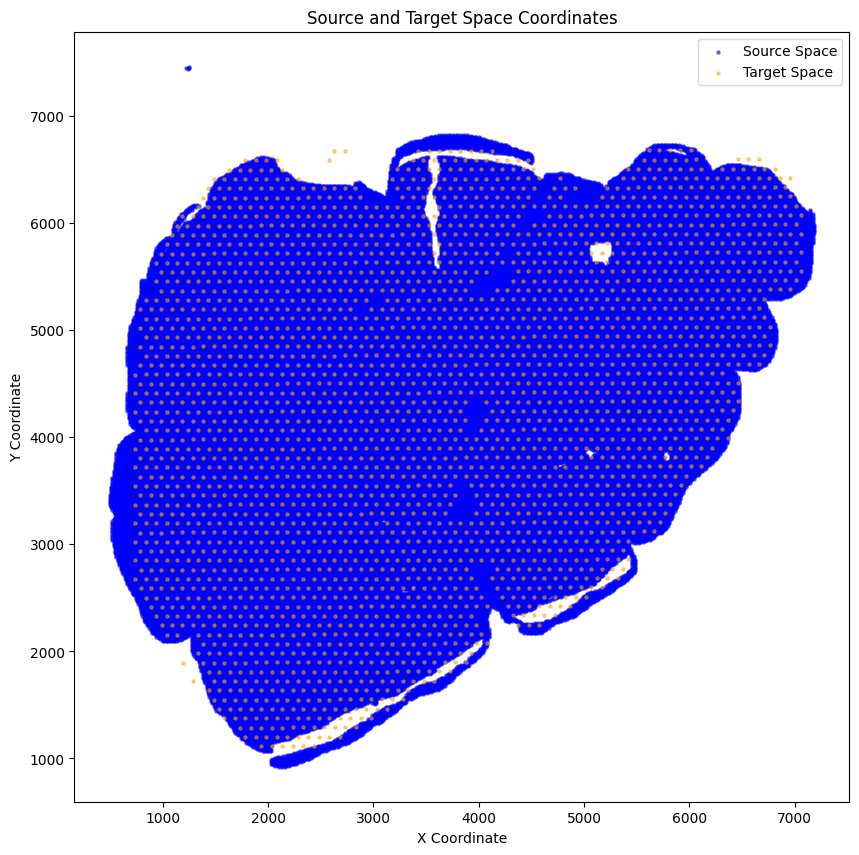

In [ ]:
# read visium info and map annotations  - make sure the 2 grids seem aligned
_,ppm_vis,vis_df = tt.read_visium(spaceranger_dir_path=path+'/',plot=False)
vis_df.rename(columns={'pxl_col': "x", 'pxl_row': "y"},inplace=True) # for new spaceranger adjust for any DF not only for visium
vis_df = tt.map_annotations_to_target(                            
    df_target=vis_df,  
    df_source=df_anno,
    ppm_target= ppm_vis,
    plot=True,
)

In [ ]:
# read visium full data 
import scanpy as sc
adata_vis = sc.read_visium(path,count_file='raw_feature_bc_matrix.h5')

In [9]:

# Align indices between adata_vis.obs and df_visium_spot
df_visium_spot_aligned = vis_df.iloc[:, 3:].reindex(adata_vis.obs.index)
adata_vis.obs = pd.concat([adata_vis.obs,vis_df.iloc[:,2:]],axis=1)
adata_vis.obsm['spatial'] = adata_vis.obsm['spatial'].astype('int')
adata_vis

AnnData object with n_obs × n_vars = 4992 × 36601
    obs: 'in_tissue', 'array_row', 'array_col', 3, 4, 5, 'pxl_row_in_fullres', 'pxl_col_in_fullres', 'x', 'y', 'L2_dist_annotations_Artifacts', 'L2_dist_annotations_Cortex', 'L2_dist_annotations_Edge', 'L2_dist_annotations_HS', 'L2_dist_annotations_Medulla', 'L2_dist_annotations_Other', 'L2_dist_annotations_PVS', 'L2_dist_annotations_Vessels', 'L2_dist_annotations_unassigned', 'annotations', 'annotations_number', 'cma_2p', 'cma_3p'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

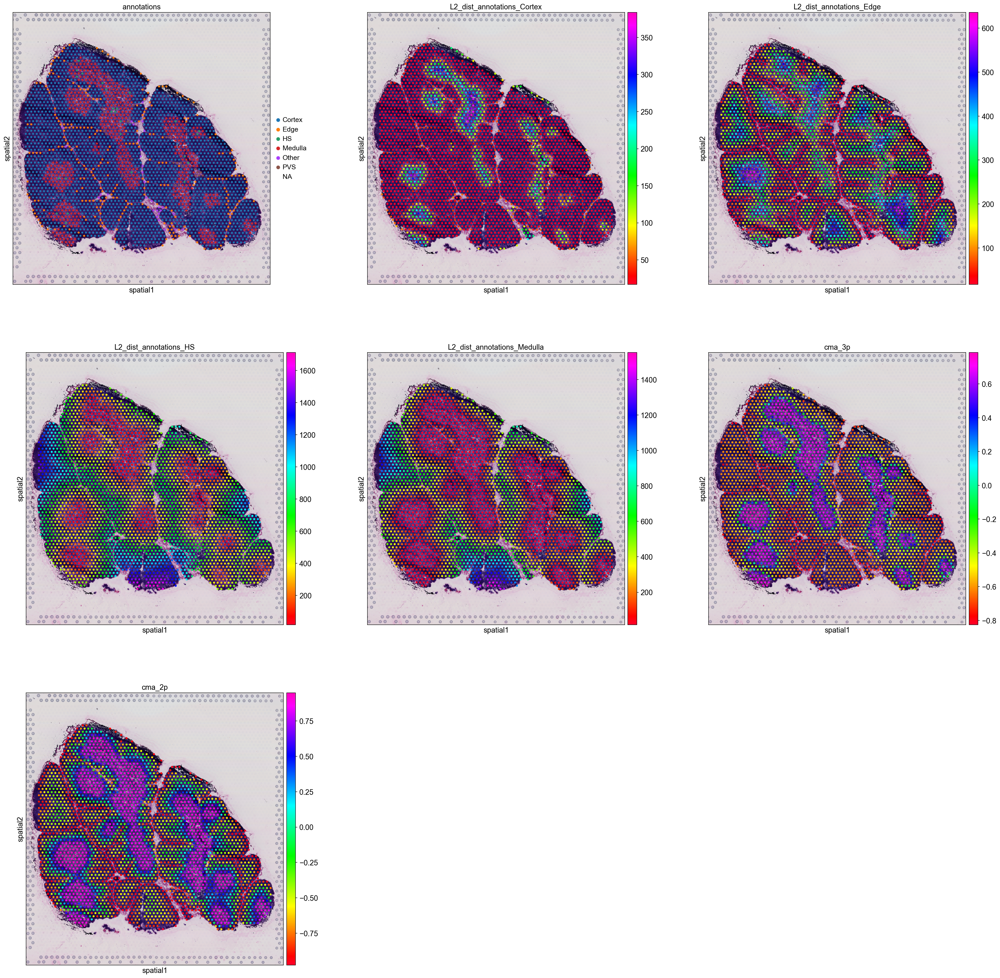

In [10]:
# plot the newly annotated visium AnnData
sc.set_figure_params(figsize=[10,10],dpi=75)
sc.pl.spatial(adata_vis,color=['annotations','L2_dist_annotations_Cortex', 'L2_dist_annotations_Edge', 'L2_dist_annotations_HS', 'L2_dist_annotations_Medulla', 'cma_3p', 'cma_2p']
              ,cmap='gist_rainbow',ncols=3)